# Now that 0x0, 1x1, 0x2 are all in .py file as functions
can start testing the effects of varying the parameters. The parameters of interest to vary are
- $\alpha$, the amp map power, which has default value -3.0
- $\beta_0$, the SED power, which has default value -3.2
- $\gamma$, the power for the $C_\ell^{\beta\beta}$. Must be constrained to $\gamma<-2$ for convergence
- $\nu_0$, the freqency we do our Taylor expansion about. Current default is 95 GHz
- $A_s, A_\beta, \ell_*$ these are less interesting as they are degenerate with one another. We can probably leave $\ell_*=80$ and just vary the synch and beta amplitudes. 

In [2]:
%load_ext autoreload
# to make modification in .py file type %autoreload

%load_ext line_profiler
#for finding out how long code takes to run
#an example of how to get diagnostics on functions
#%lprun -f ff.generate_map_full ff.generate_map_full(384, A_BB, alpha_BB, beta_sigma, freqs, nu0)

In [3]:
#trying to consolidate the work so far into a cohesive document and notation. Pushing definitions into 
#separate .py file

#------packages-------------------
%pylab inline
import time
import healpy as hp
import matplotlib.pyplot as plt
import foreground_functions as ff
import scipy.special as sp #for the zeta function sp.zeta() in the 0x2 term
from scipy.stats import kstest, norm

#-------BB parameters (to start)--------
A_BB = 1.7e3
alpha_BB = -3.0
beta_BB = -3.2
# beta_sigma = 1.5e-6

A_beta = 1e-6
gamma_BB = -2.1 #needs to be less than -2 for the 0x2 term to converge
nu0 = 95e9

crit = 2/np.log(10)
sigma_default = crit/3

# #-------map paramters--------------------
# nside = 128
# Lmax = 3*nside
# ells = np.arange(0,Lmax)

#define list of frequencies going from 10 to 300 GHz, sampling 20 points
freqs = np.linspace(30,300,4)*1.e9

Populating the interactive namespace from numpy and matplotlib


In [4]:
#define some different ranges of each parameter

#set of alpha values
alphas = np.linspace(-6., -1., 6)
#set of beta_0 values
beta_0s = np.linspace(-6., -1., 10)
#set of gamma values
gammas = np.linspace(-4., -2.001, 10)
#set nu0 values
nu0s = np.linspace(2.3e9, 100e9, 3)

In [80]:
%autoreload

In [46]:
#to do here
'''
write script to take in relevant arguments and then outputs all
the plots of the powerspectra overlayed with the 0x0--0x2 moments
at the relevant freqencies

plot residuals and see what's up

add in a parameter to the plots to do multiple realisations and plot the avg power spectrum we're trying to fit
could also put boolean optional parameter to overlay the multiple realisations
''';

In [81]:
#moments with default values to test the residual plots
ells = np.arange(0,384)
moment0x0 = ff.auto0x0(freqs)
moment1x1 = ff.auto1x1(freqs)
moment0x2 = ff.auto0x2(freqs)
model = moment0x0+moment1x1+moment0x2

In [48]:
test_map = ff.map_full_power(freqs)

In [49]:
resid = np.zeros((len(freqs), len(ells)))
for i in range(len(freqs)):
    resid[i] = hp.anafast(test_map[i])-model[i]

In [50]:
#make a function to calculate chi-square
def get_chi_square(resid):
    chi_square = 0
    for i in range(len(resid)):
        chi_square += resid[i]**2
    return chi_square

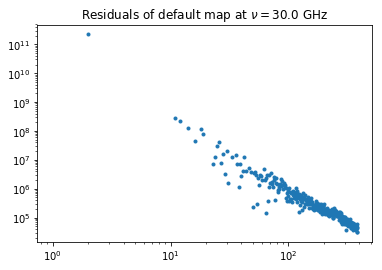

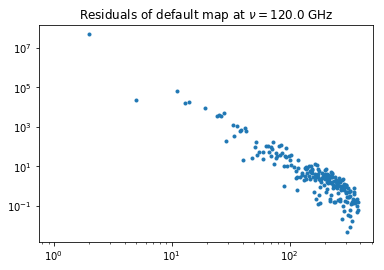

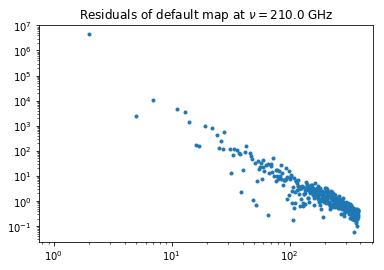

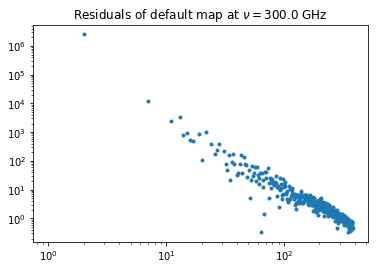

In [51]:
for i in range(len(freqs)):
    figure()
    loglog(ells, resid[i], '.')
    title(r'Residuals of default map at $\nu=$' + str(np.round(1e-9*freqs[i],2)) + ' GHz')

In [52]:
chi_square = np.zeros(len(freqs))
for i in range(len(freqs)):
    chi_square[i] = get_chi_square(resid[i])

In [53]:
chi_square

array([4.90181797e+22, 2.14374957e+15, 1.91110509e+13, 6.29185070e+12])

Text(0.5, 1.0, 'loglog of chi^2 vs frequency with fixed other parameters')

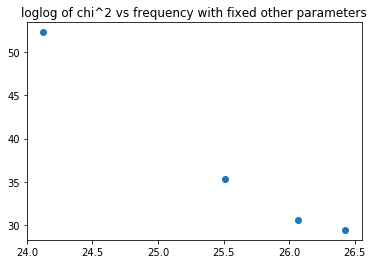

In [54]:
scatter(np.log(freqs),np.log(chi_square))
title('loglog of chi^2 vs frequency with fixed other parameters')

In [55]:
%autoreload

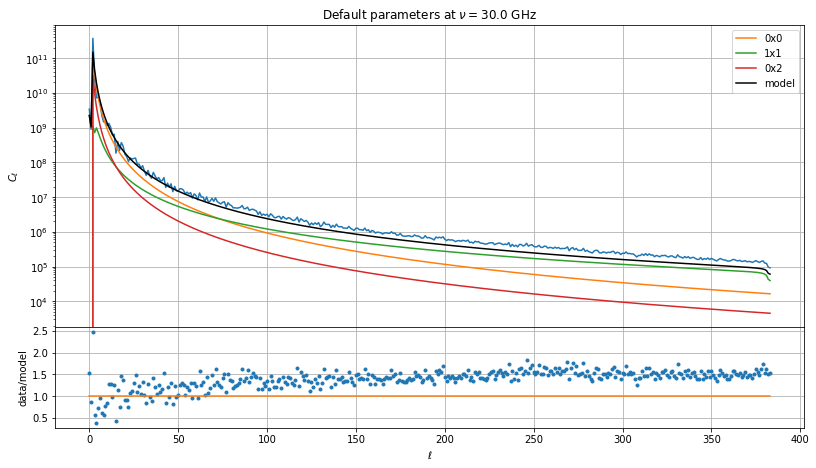

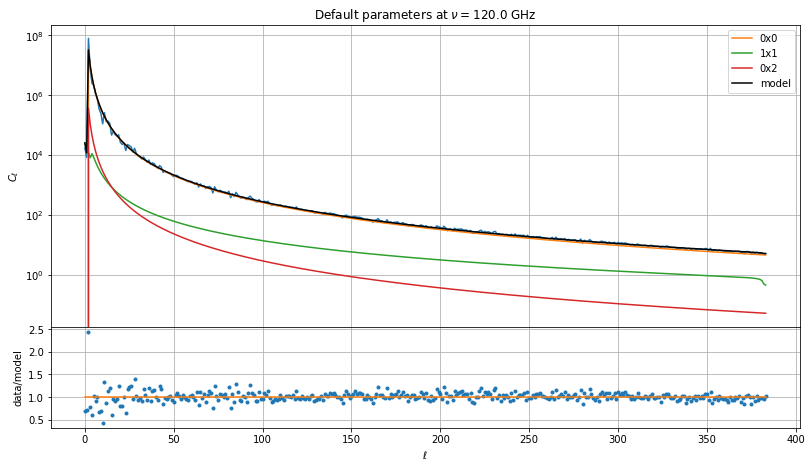

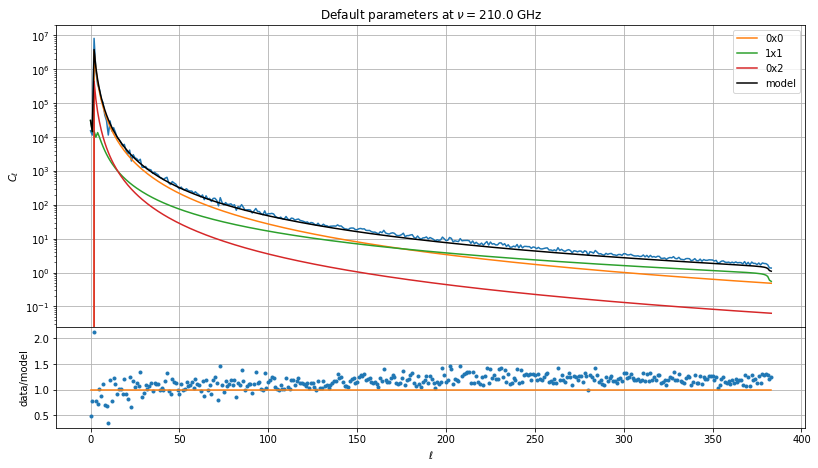

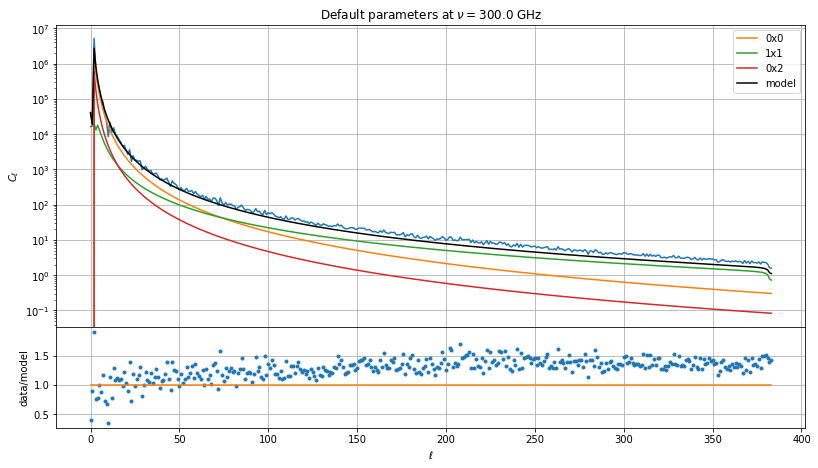

In [56]:
for i in range(len(freqs)):
    anafast = hp.anafast(test_map[i])
    
    fig1 = figure(i, figsize=(13,7))
    
    #Plot Data-model
    frame1=fig1.add_axes((.1,.3,.8,.6))
    #xstart, ystart, xend, yend [units are fraction of the image frame, from bottom left corner]
    semilogy(ells, anafast)
    semilogy(ells, moment0x0[i], label='0x0')
    semilogy(ells, moment1x1[i], label='1x1')
    semilogy(ells, moment0x2[i], label='0x2')
    semilogy(ells, model[i], 'k', label='model')
    frame1.set_xticklabels([]) #Remove x-tic labels for the first frame
    ylabel(r'$C_\ell$')
    title(r'Default parameters at $\nu=$' + str(np.round(1e-9*freqs[i],2)) + ' GHz')
    grid()
    legend()
    #Residual plot
    ratio = anafast/model[i]
    
#     difference = np.abs(anafast-model[i])
    frame2=fig1.add_axes((.1,.1,.8,.2)) 
    plot(ells, ratio, '.')
    plot(ells, ones_like(ells))
    ylabel('data/model')
    xlabel(r'$\ell$')
#     semilogy(ells,difference,'.')
    grid()
    

In [57]:
resid.shape

(4, 384)

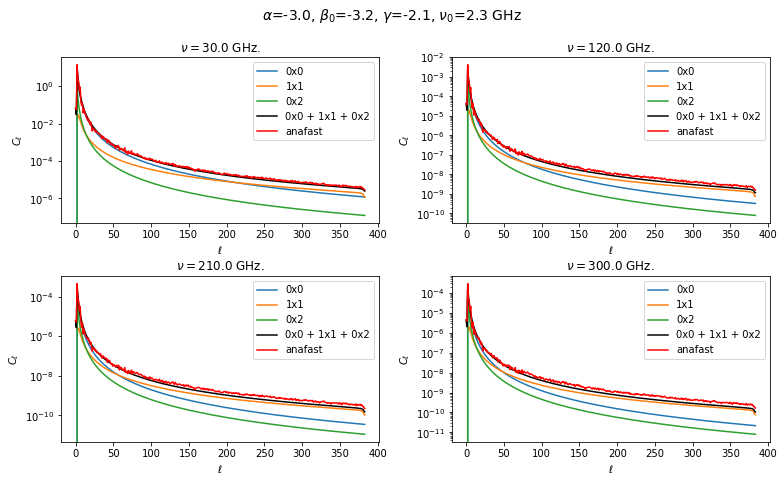

In [64]:
ff.get_plots(freqs)

In [87]:
%autoreload

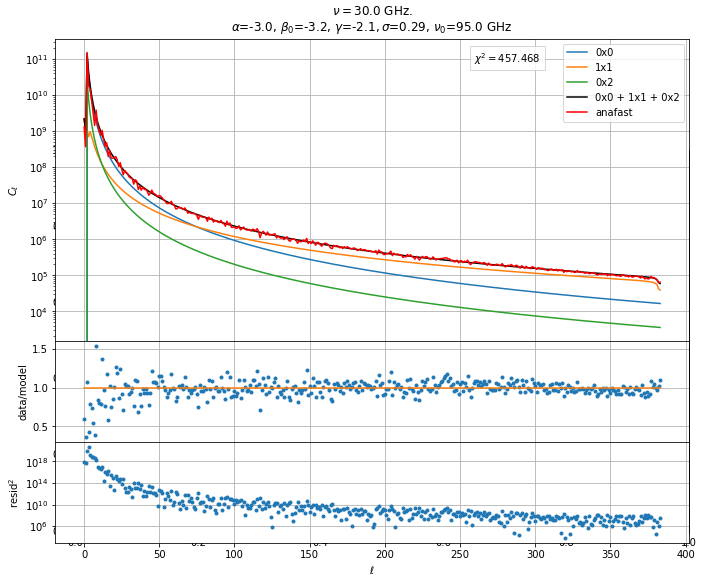

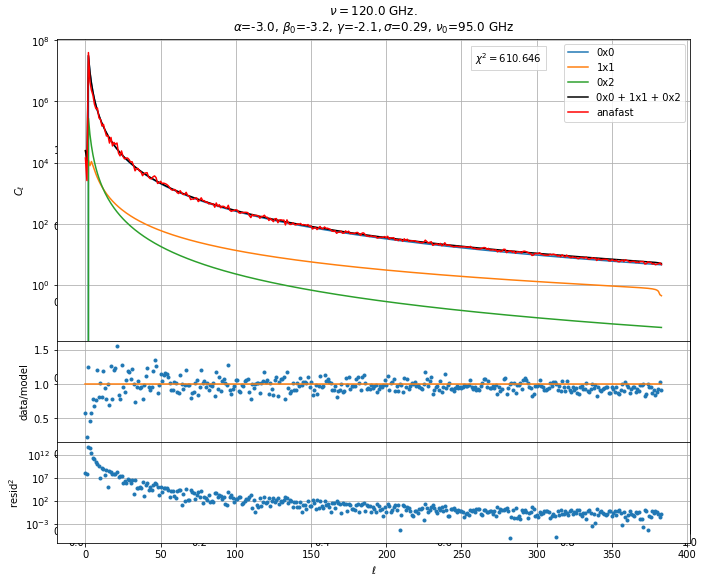

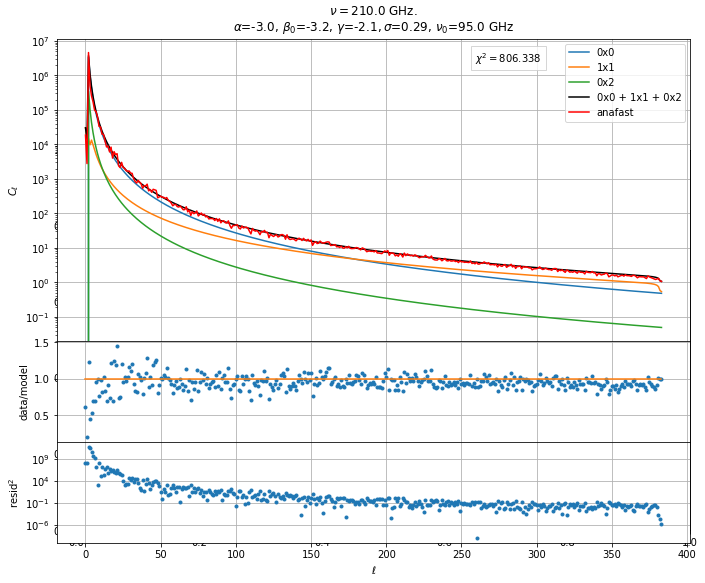

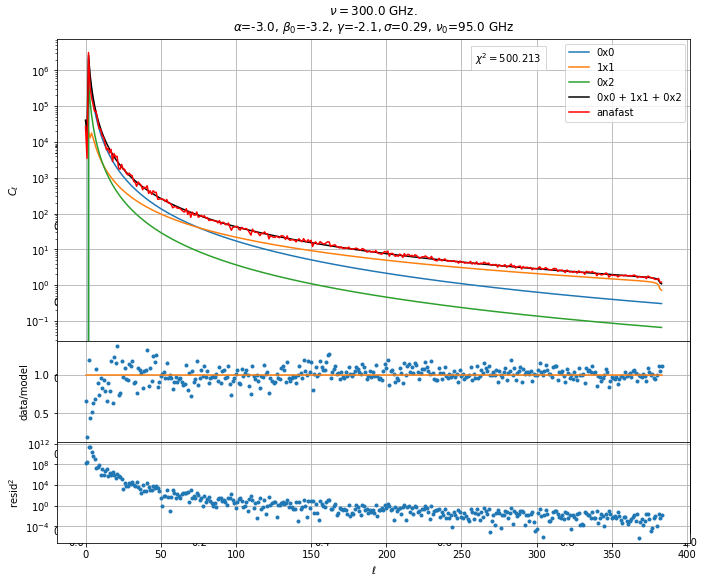

11.654719114303589


In [88]:
start=time.time()
ff.get_plots(freqs)
print(time.time()-start)

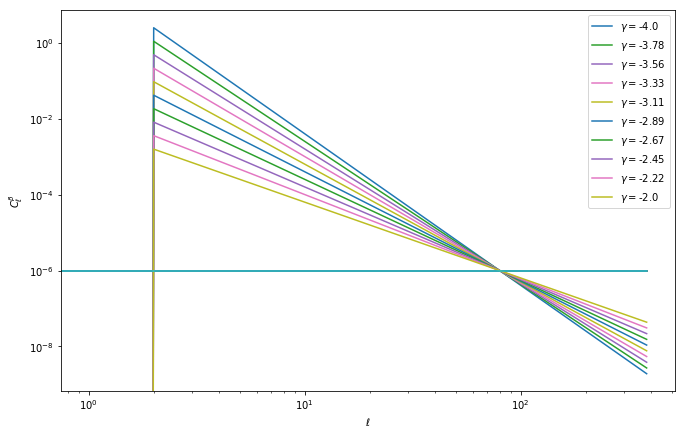

In [164]:
#check the amplitude normalisation for gamma
#what it used to look like, now instead of fixing that point we fix the std of the beta map based on convergence
# figure(figsize=(11,7))
# for gamma in gammas:
#     bcls, beta_map = ff.map_power_beta(gamma=gamma)
#     loglog(bcls, label=r'$\gamma=$'+str(np.round(gamma,2)))
#     x = np.arange(384)
#     y = A_beta*ones_like(x)
#     loglog(y)
#     xlabel(r'$\ell$')
#     ylabel(r'$C_\ell^\beta$')
#     legend();

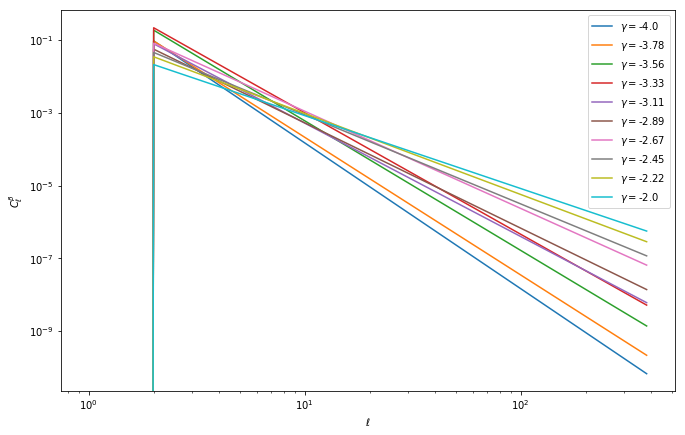

In [68]:
%autoreload
#check the amplitude normalisation for gamma
figure(figsize=(11,7))
for gamma in gammas:
    bcls, beta_map = ff.map_power_beta(gamma=gamma)
    check_bcls = hp.anafast(beta_map)
    loglog(bcls, label=r'$\gamma=$'+str(np.round(gamma,2)))
#     loglog(check_bcls, label=r'$\gamma=$'+str(np.round(gamma,2)))
#     x = np.arange(384)
#     y = A_beta*ones_like(x)
#     loglog(y)
    xlabel(r'$\ell$')
    ylabel(r'$C_\ell^\beta$')
    legend();

In [69]:
%autoreload
bcls_2 , betamap_2 = ff.map_power_beta(gamma=-2.1)
bcls_4 , betamap_4 = ff.map_power_beta(gamma=-4.0)

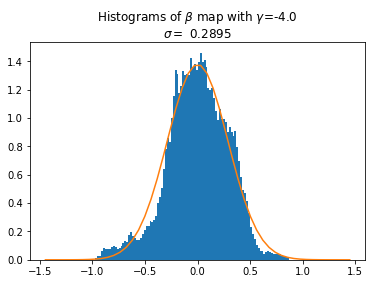

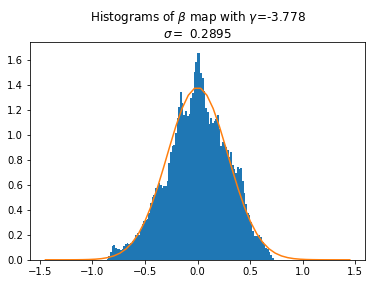

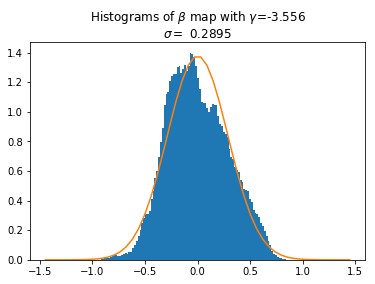

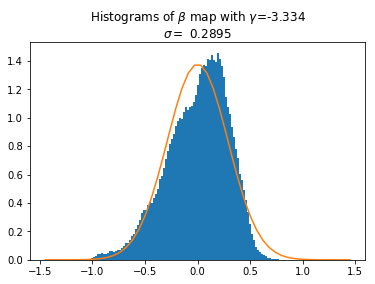

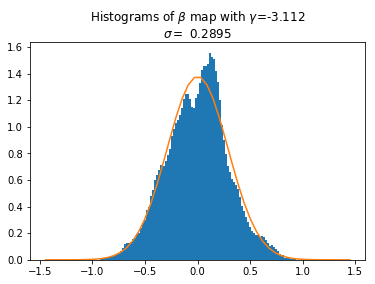

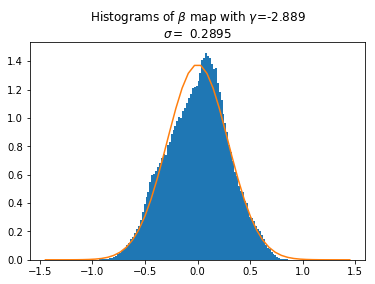

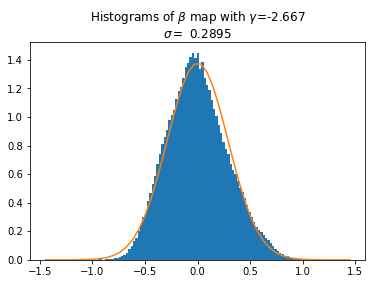

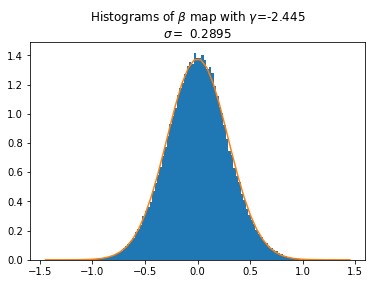

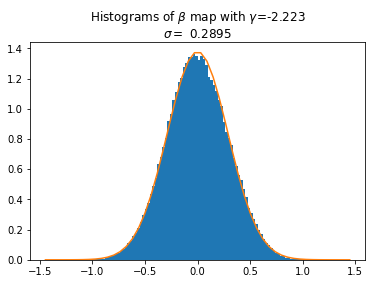

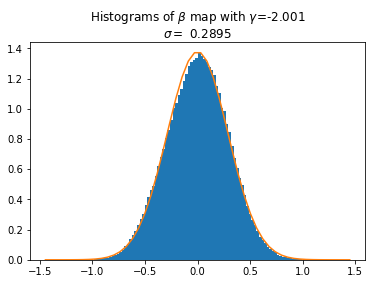

In [72]:
for i in range(len(gammas)):
    bcls_i, betamap_i = ff.map_power_beta(gamma=gammas[i])
    mean = np.mean(betamap_i)
    std = np.std(betamap_i)
    betamap_i -= mean
#     hp.mollview(betamap_i)
    
    figure()
    x = np.linspace(-5*std, 5*std)
    y = norm(0, std)
    title(r'Histograms of $\beta$ map with $\gamma$='+str(np.round(gammas[i],3)) + '\n' + r'$\sigma = $ {:.4f}'.format(std))
    hist(betamap_i, bins=100, density=True);
    plot(x, y.pdf(x))

0.28952965460216784

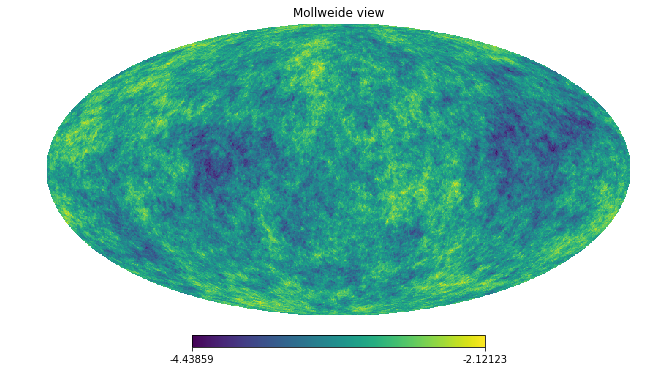

In [73]:
hp.mollview(betamap_2)
np.std(betamap_2)

0.28952965460216784

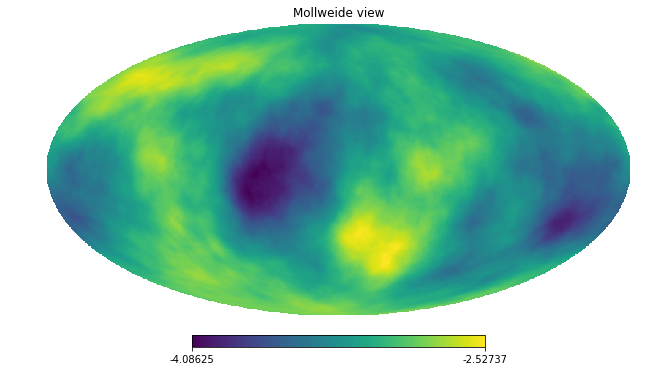

In [74]:
hp.mollview(betamap_4)
np.std(betamap_4)

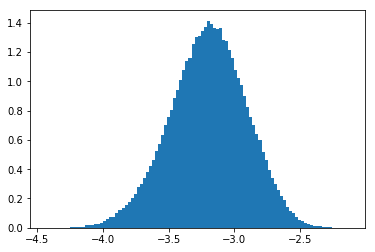

In [75]:
hist(betamap_2, bins=100, density=True);

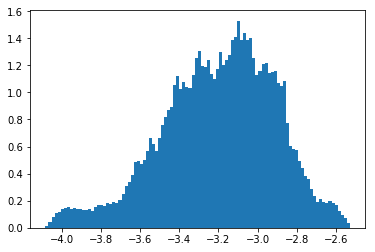

In [76]:
hist(betamap_4, bins=100, density=True);

# Vary $\nu_0$
# THIS IS NO LONGER INTERESTING AS WE HAVE A REQUIREMENT OF CONVERGENCE, WE CAN CHOOSE TO SET $\nu_0 = 95 \ \rm GHz$.

In [96]:
%autoreload

In [97]:
# for nu in nu0s:
#     ff.get_plots(freqs, nu0=nu)    

# Vary $\alpha$

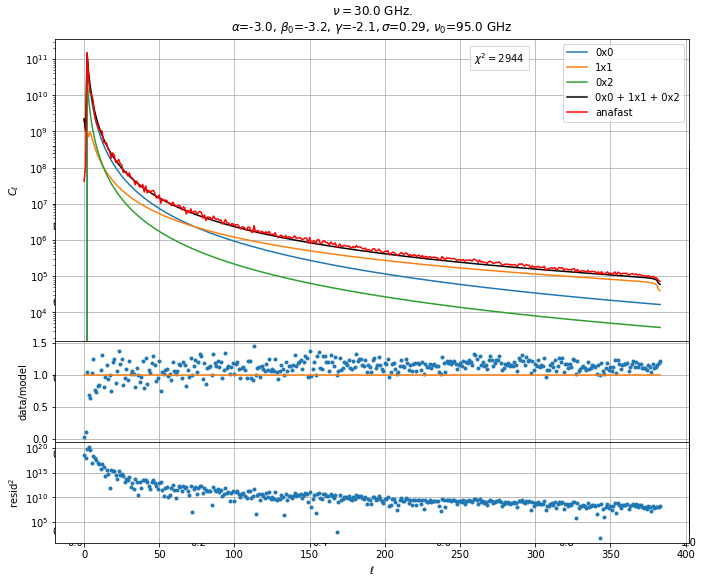

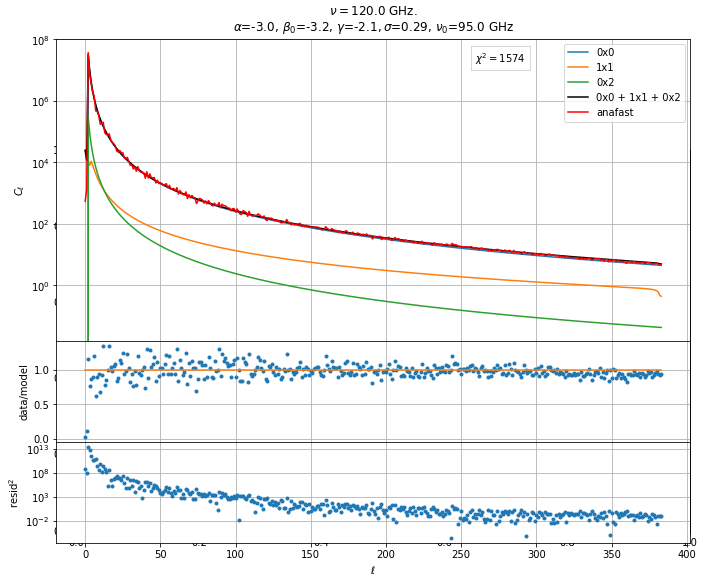

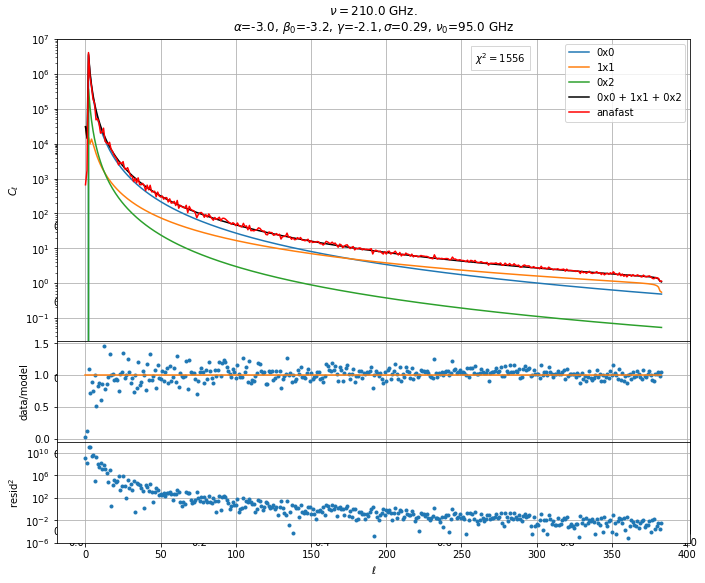

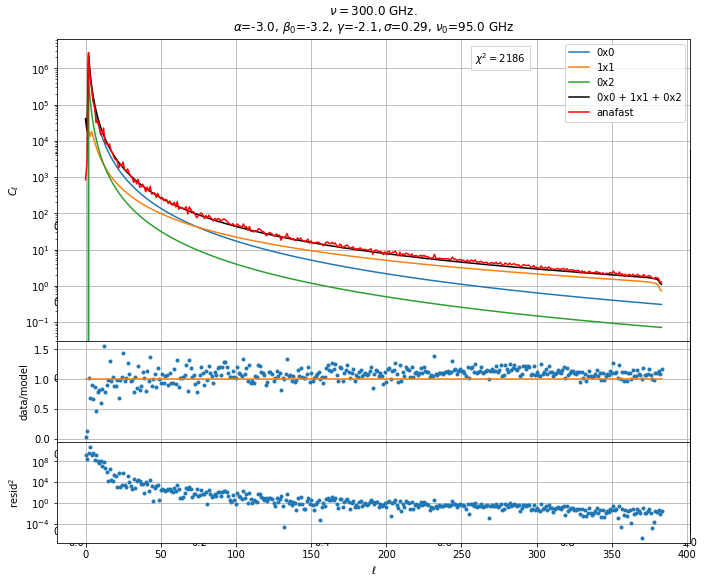

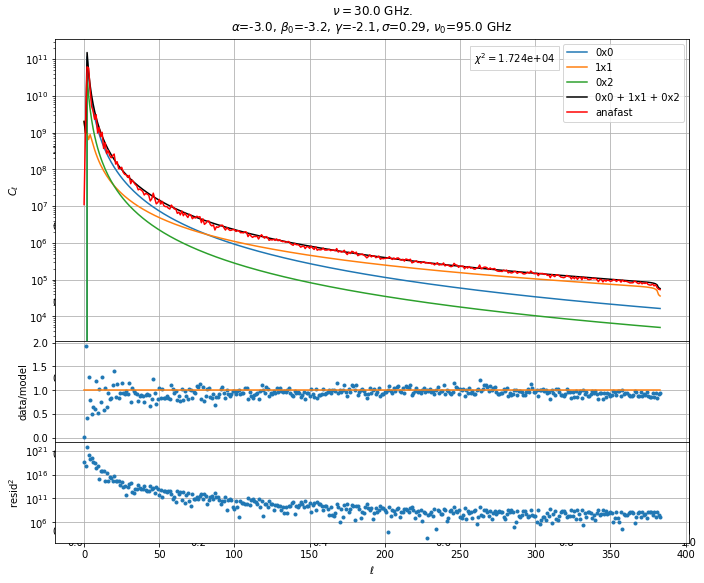

...

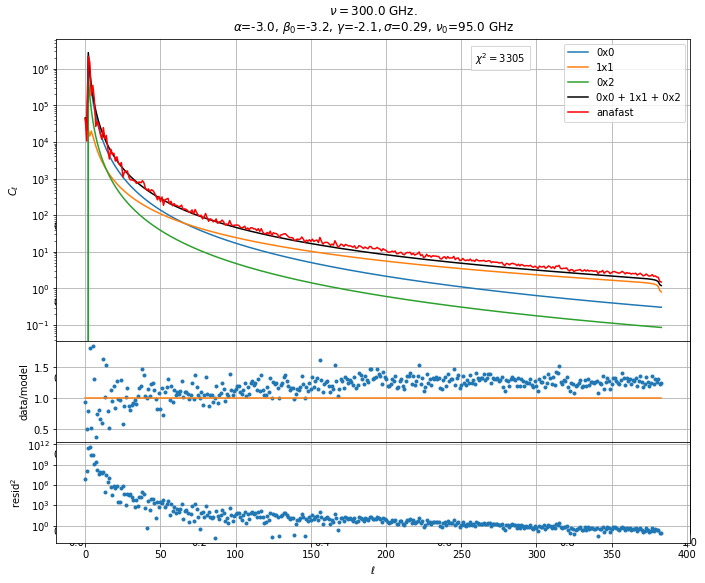

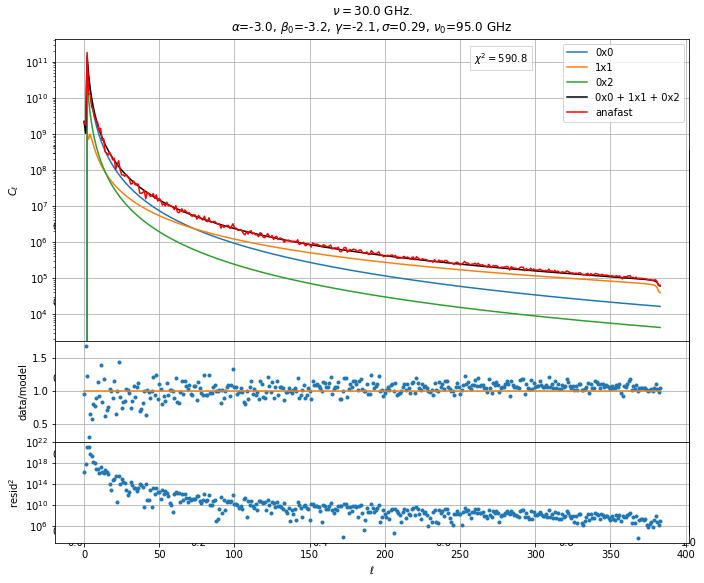

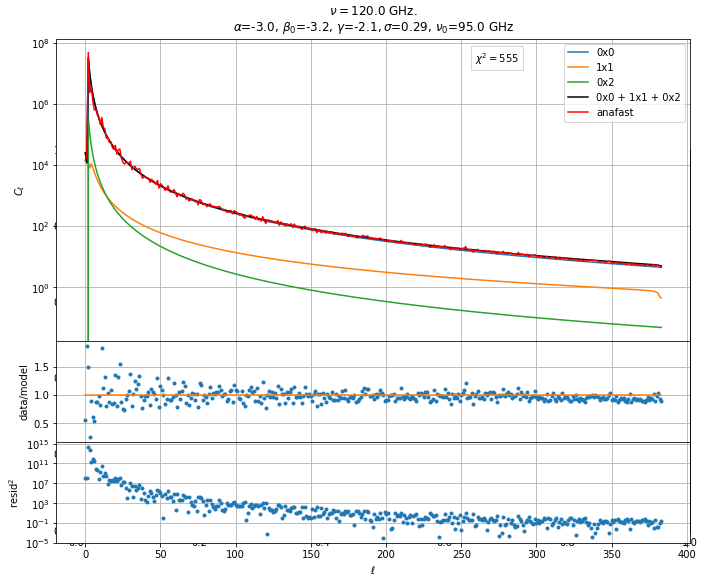

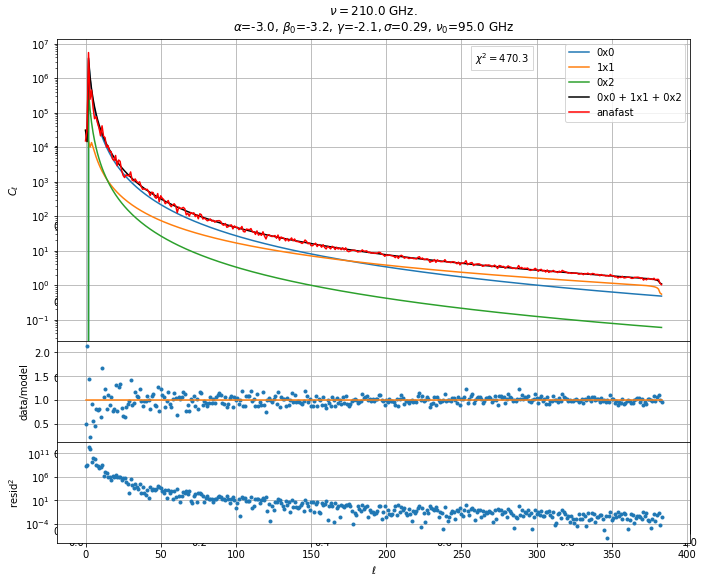

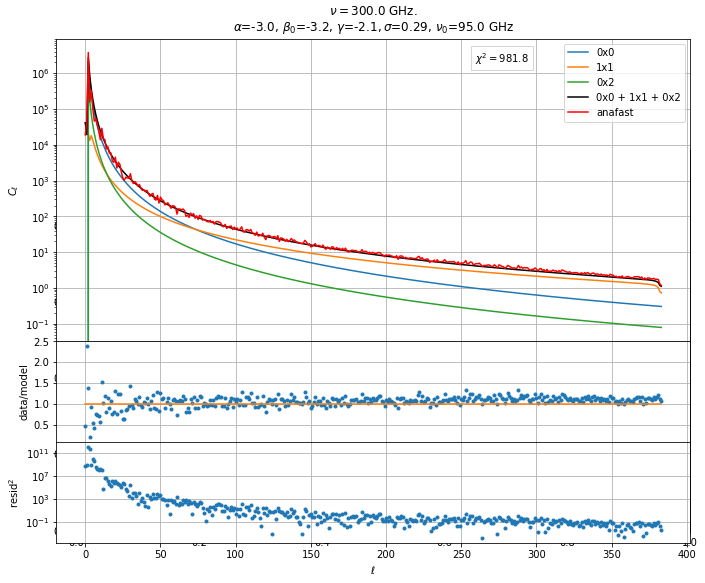

In [98]:
for alpha in alphas:
    ff.get_plots(freqs)

# Vary $\beta$

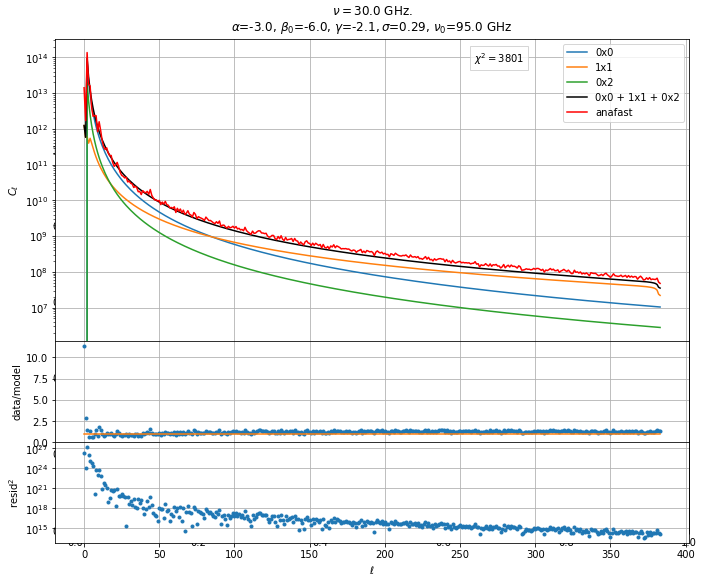

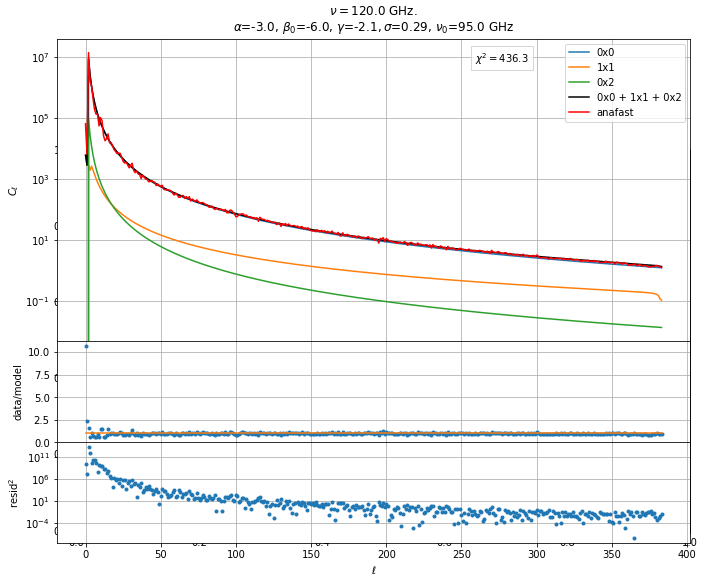

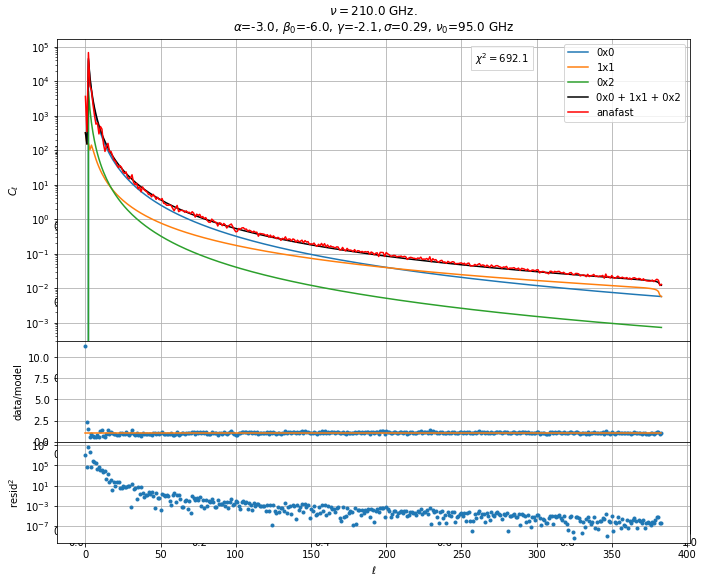

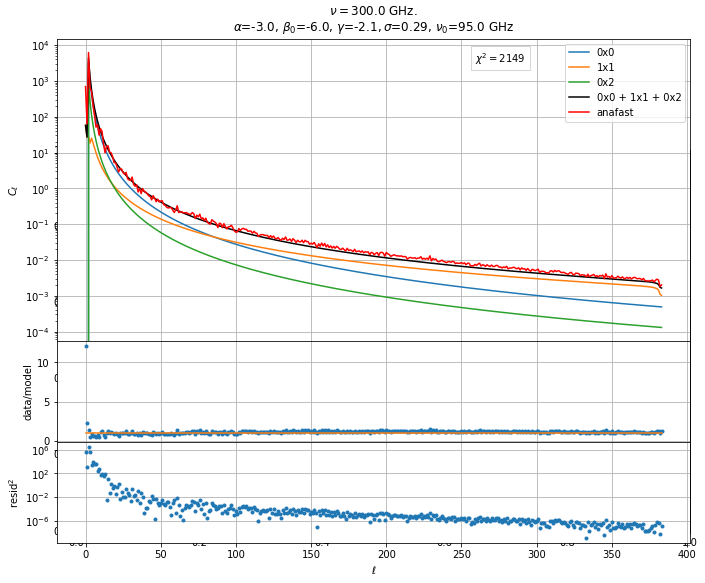

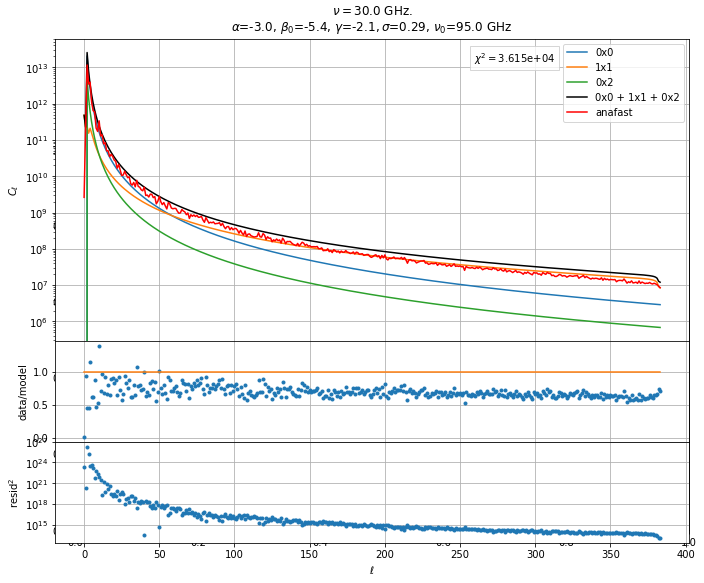

...

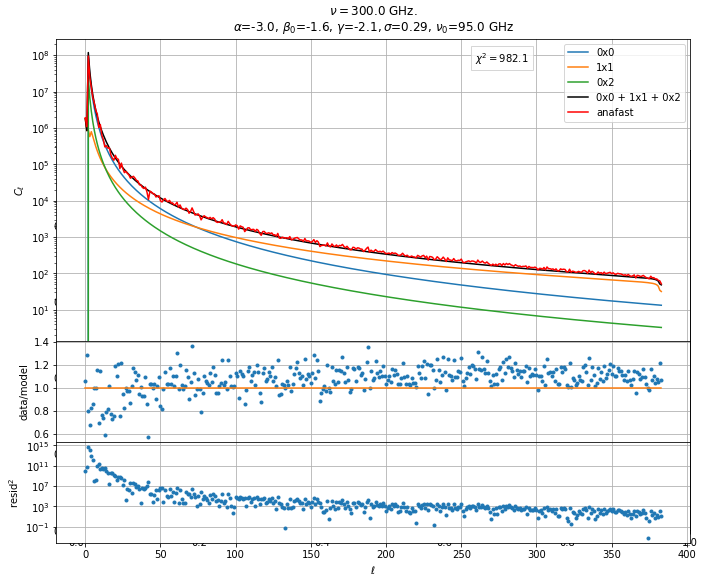

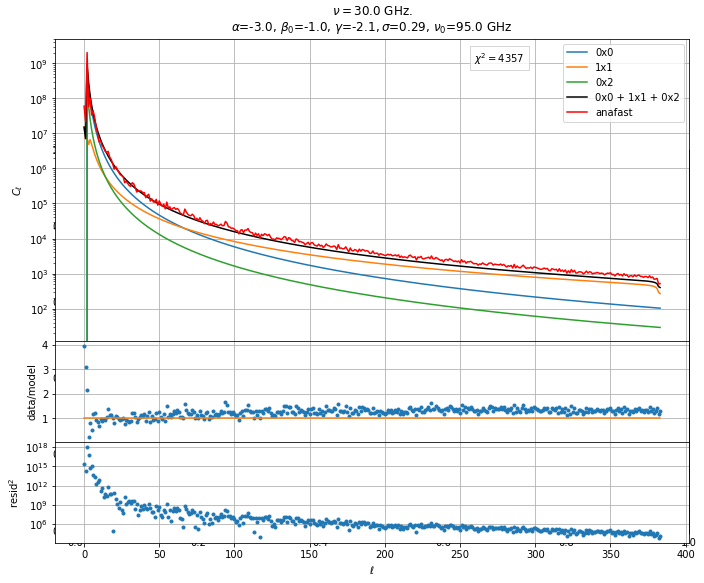

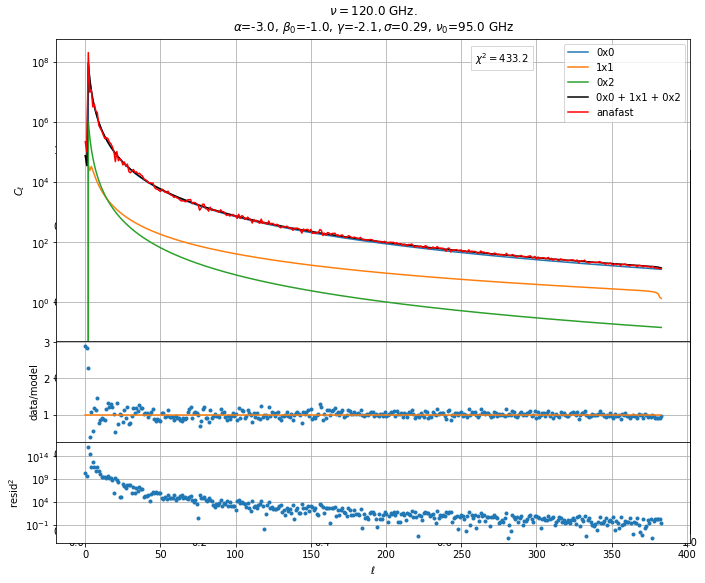

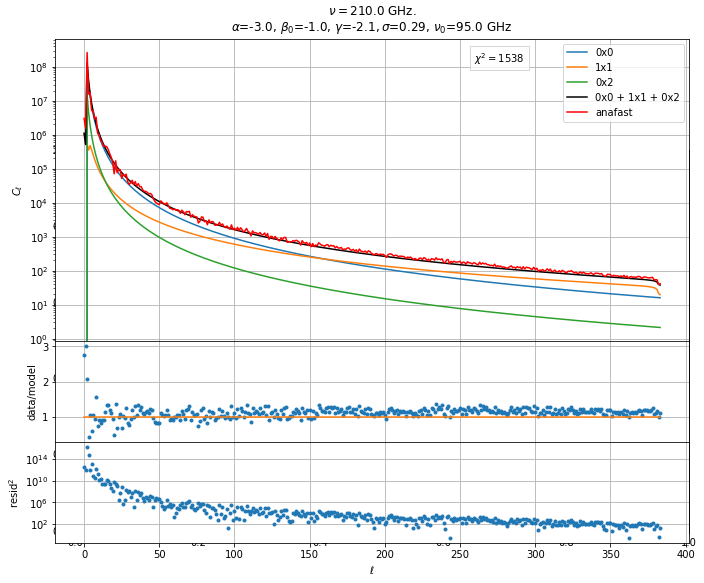

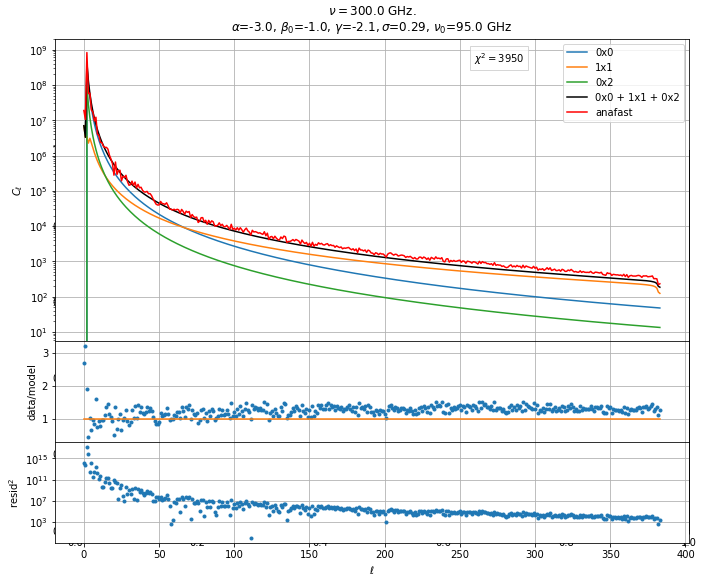

In [99]:
for beta in beta_0s:
    ff.get_plots(freqs, beta_0=beta)

# Vary $\gamma$

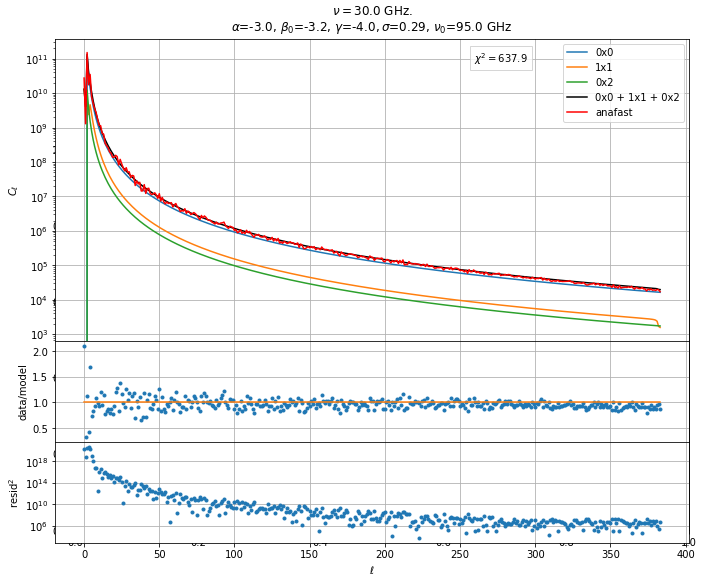

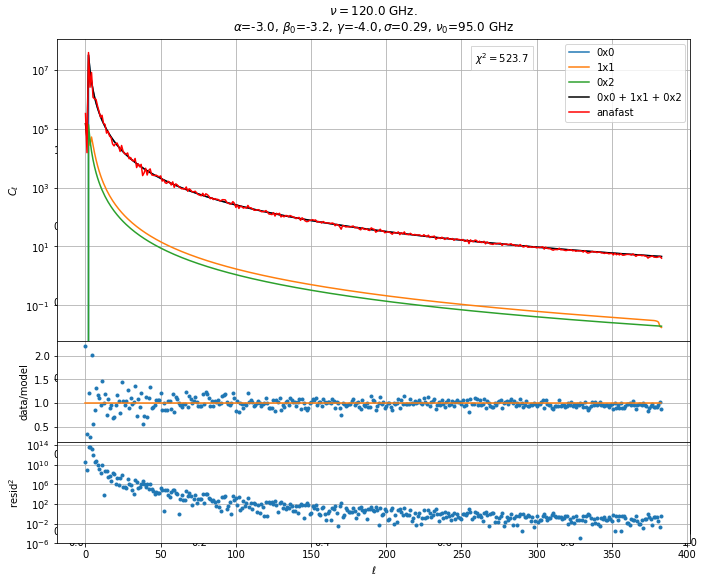

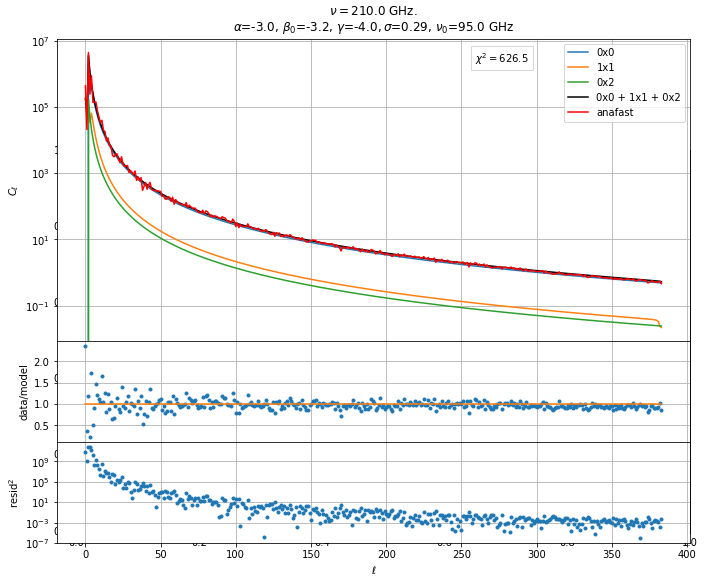

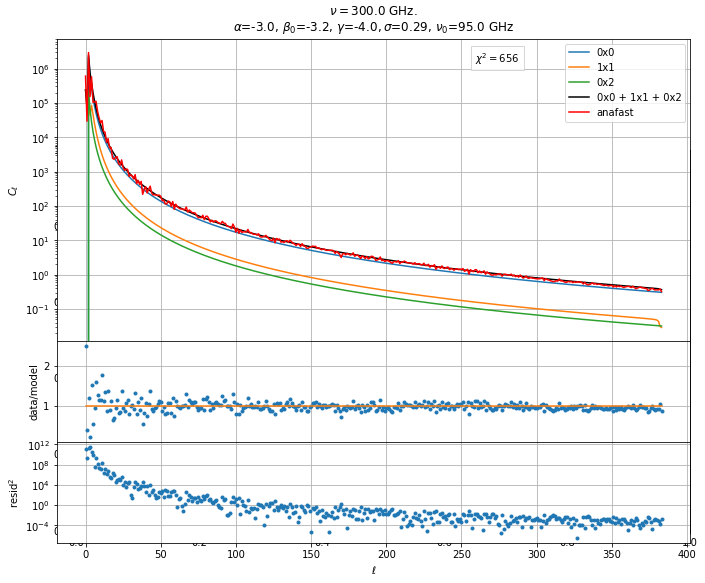

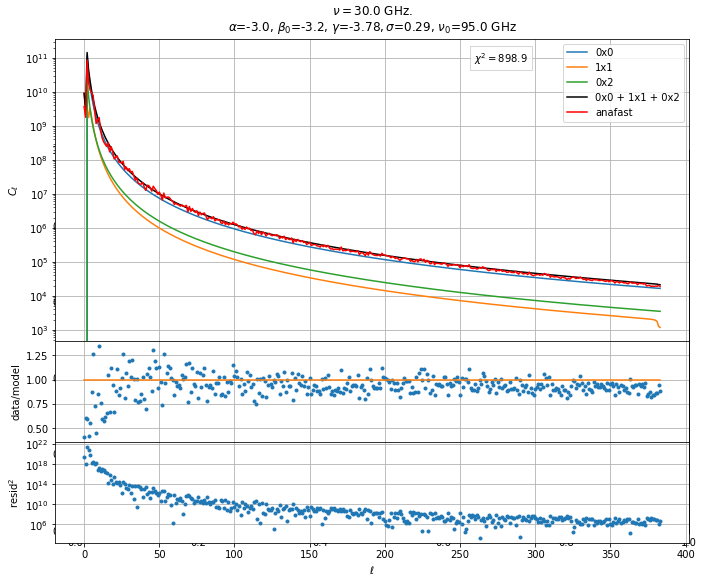

...

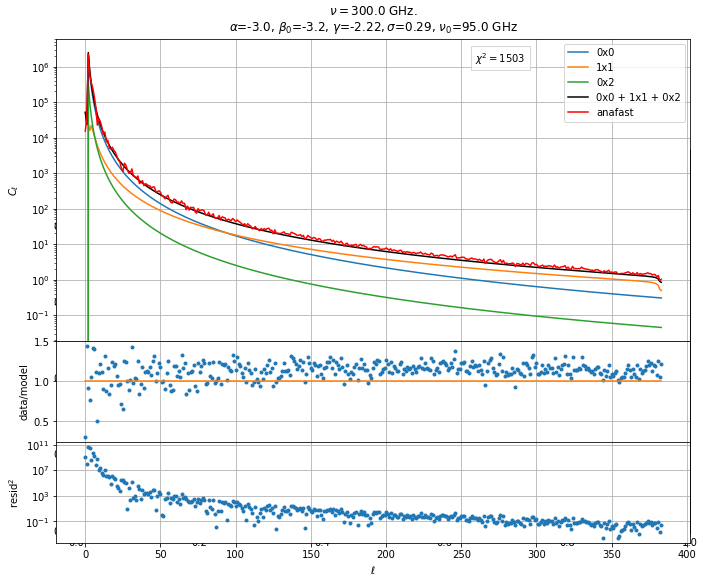

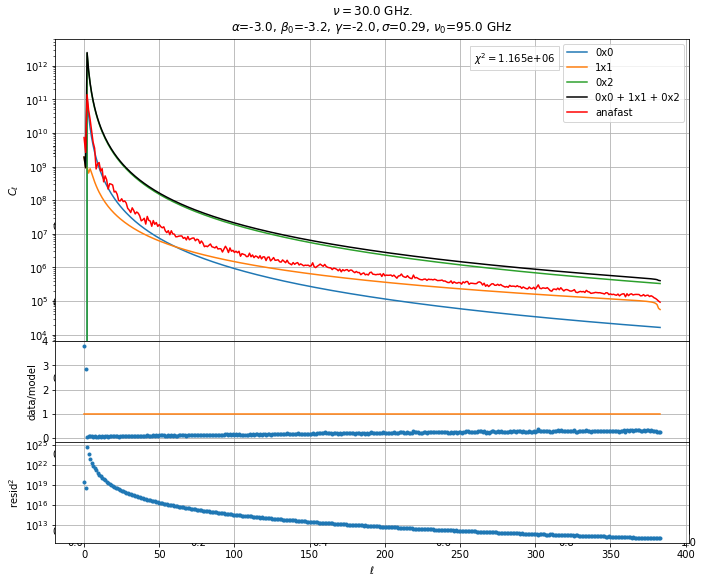

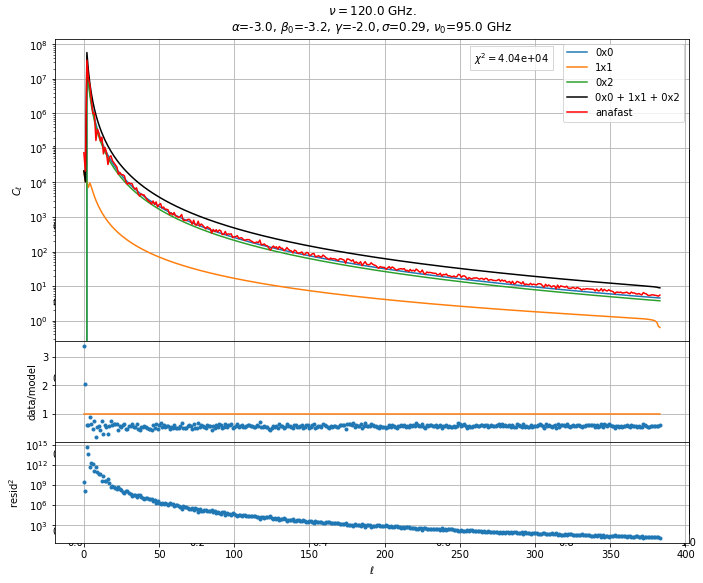

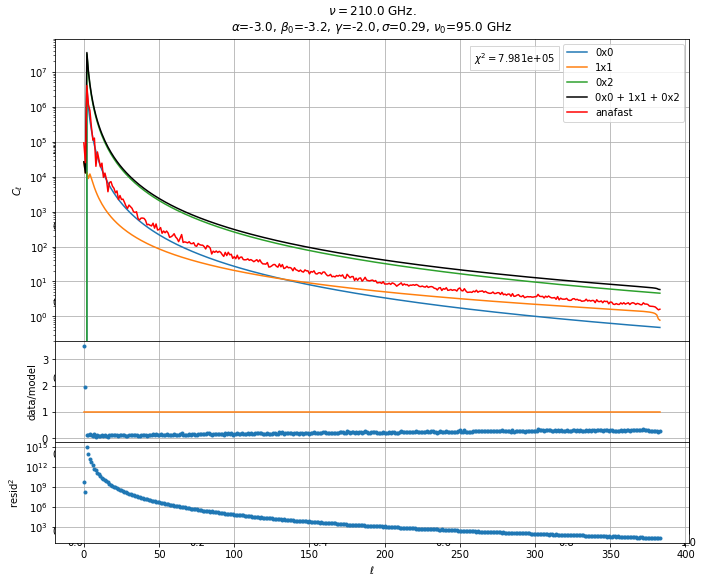

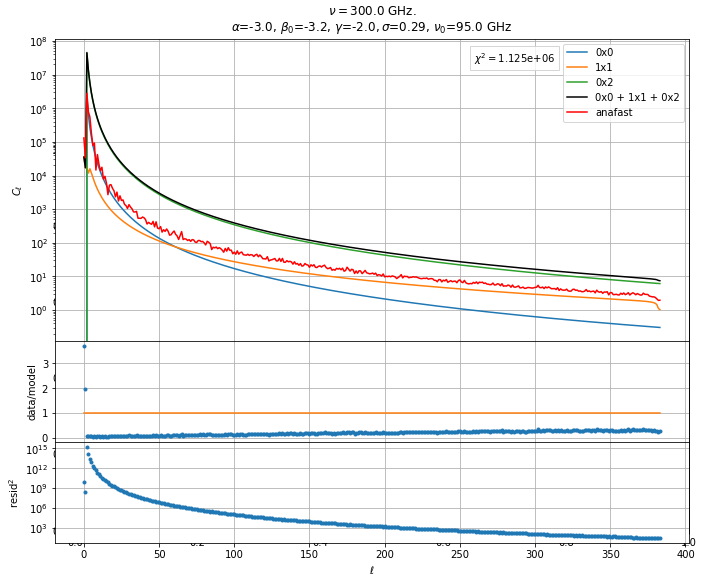

In [100]:
for gamma in gammas:
    ff.get_plots(freqs, gamma=gamma)

In [ ]:
#hmmmmm...

In [31]:
%autoreload

In [36]:
N=100
start=time.time()
realisation = ff.realisation_power(N, freqs)
print(time.time()-start)

82.76938390731812


In [33]:
# %lprun -f ff.realisation_power ff.realisation_power(N, freqs)

In [37]:
# %lprun -f ff.map_amp ff.map_amp()

In [38]:
mean_ps = np.mean(realisation, 0)

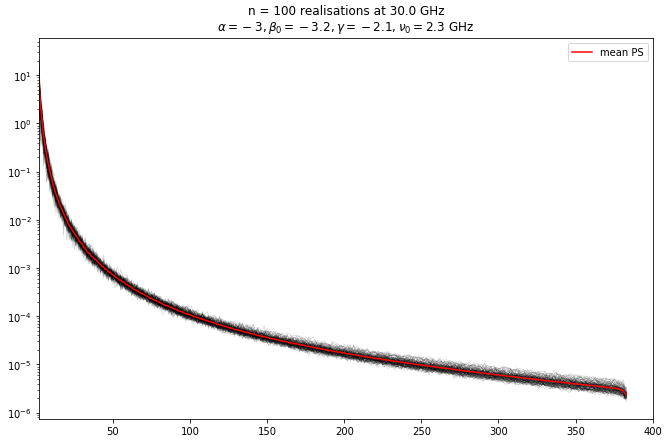

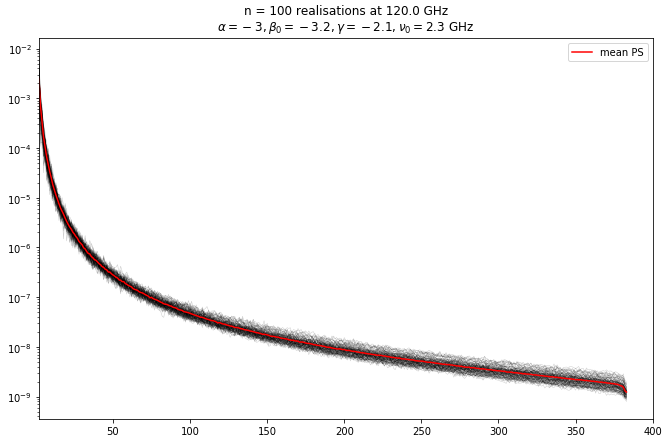

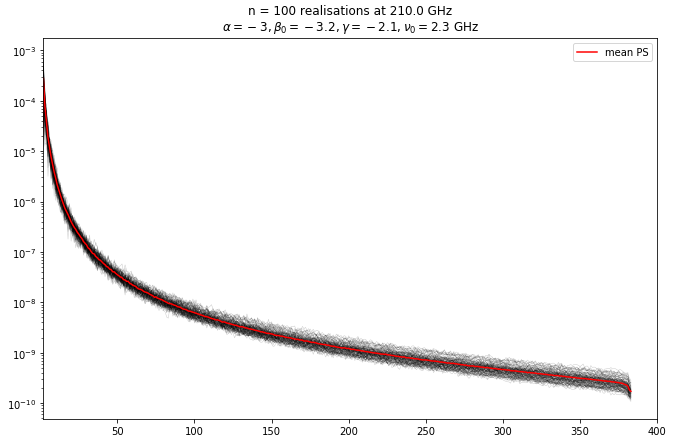

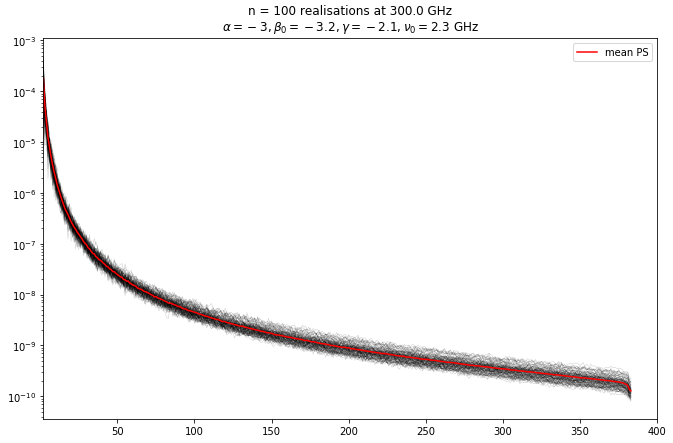

In [43]:
for i in range(len(freqs)):
    figure(figsize=(11,7))
    
    for j in range(N):
        semilogy(realisation[j,:,i], 'k', alpha = 0.2, lw=.5)
        
    semilogy(mean_ps[:,i], 'r', label='mean PS')
    xlim(2,400)
    title('n = ' + str(N) + ' realisations at ' + str(np.round(1e-9*freqs[i])) + ' GHz' +"\n" + r'$\alpha = -3, \beta_0 = -3.2, \gamma=-2.1, \nu_0=2.3 \ \rm GHz$')
    legend();

In [172]:
x = np.loadtxt('test.txt')

In [174]:
x.shape

(384, 4)

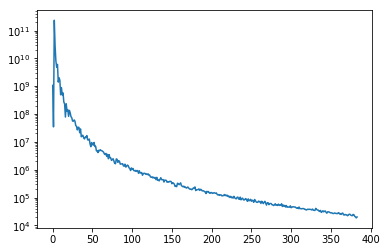

In [175]:
semilogy(x[:,0])

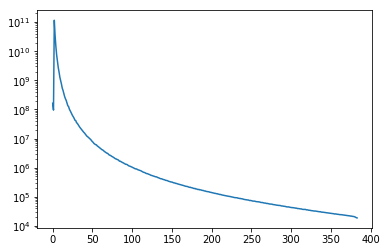

In [176]:
x = np.loadtxt('test.txt')
semilogy(x[:,0])

In [179]:
x = np.load('output.npy')

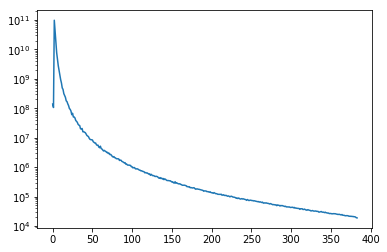

In [180]:
semilogy(x[:,0])

In [ ]:
# #set of alpha values
# alphas = np.linspace(-6., -1., 6)
# #set of beta_0 values
# beta_0s = np.linspace(-6., -1., 10)
# #set of gamma values
# gammas = np.linspace(-4., -2.001, 10)
# #set nu0 values
# nu0s = np.linspace(2.3e9, 100e9, 3)

In [93]:
#set up fake parameters
fake_alphas = np.linspace(1,4,2) #2 alphas
fake_betas  = np.linspace(1,6,3) #3 betas
fake_gammas = np.linspace(1,8,4) #4 gammas

In [95]:
#set up array to hold all the parameters
theta = np.zeros((len(fake_alphas),len(fake_betas),len(fake_gammas)))
print(theta.shape)

(2, 3, 4)


In [97]:
print(theta)
theta[0,0,0] = 1
print(theta)

[[[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]]
[[[1. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]]


In [98]:
theta[:,1,1].shape

(2,)

In [35]:
2.5-int(2.5)

0.5

In [37]:
realise = np.load('realisation.npy')

In [46]:
realise.shape
realise[1,:,0].shape
realise[:,0,0].shape

(100,)

In [60]:
mean_ps = np.mean(realise,0)
mean_std = np.std(realise,0)

In [63]:
mean_std[:,0].shape

(384,)

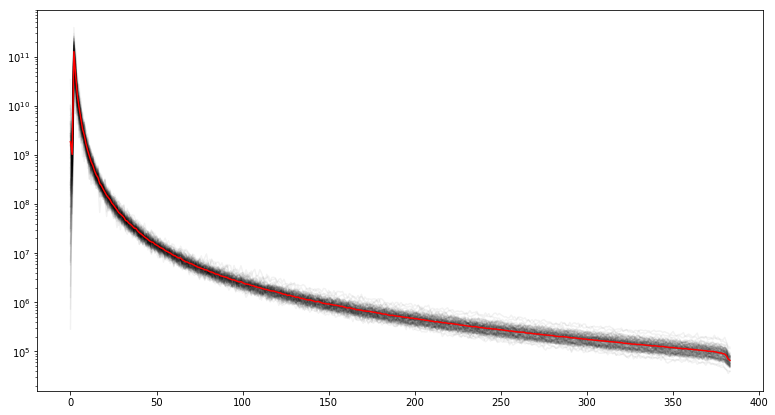

In [59]:
figure(figsize=(13,7))

for i in range(len(realise[:,0,0])):
    semilogy(realise[i,:,0],'k', alpha=0.05)
semilogy(mean_ps[:,0], 'r')
# xlim(150,200)

In [64]:
mean_ps

array([[1.86708458e+09, 1.88366015e+04, 2.44165560e+04, 3.44071226e+04],
       [1.02885917e+09, 1.00464658e+04, 1.29243804e+04, 1.81568621e+04],
       [1.26800324e+11, 3.12703814e+07, 3.53592448e+06, 2.38296132e+06],
       ...,
       [8.16699196e+04, 4.92634109e+00, 1.30302915e+00, 1.53502272e+00],
       [7.03622005e+04, 4.77105450e+00, 1.14331516e+00, 1.31468077e+00],
       [6.58623023e+04, 4.72150060e+00, 1.09661882e+00, 1.24517951e+00]])

# $\chi^2$ for varying $\alpha$
These will be slow, the slowness in calculating $\chi^2$ comes from calculating the `1x1` moment, which comes from the `get_wigner_sum` function. There are places in `get_wigner_sum` that take up $\mathcal{O}(10\%)$ of the time that seem like they should be quick... 

$\chi^2$ stuff is behaving worryingly. The $\chi^2$ value appears highly dependent on the particular realisation, consider box and whisker plot below, where $\chi^2$ varies by 4-5 orders of magnitude in the outliers, and that even the median box varies by order 3-5. How do we get around this except by averaging everything, which we can't do on the real sky, and how can we hope to fit with this?

In [109]:
%autoreload

In [105]:
mom0x0 = ff.auto0x0(30e9)

In [110]:
mom1x1 = ff.auto1x1(30e9)

In [114]:
mom0x2 = ff.auto0x2(30e9)

In [191]:
alphas_long = np.linspace(-6., -1., 20)
alphas_tight = np.linspace(-3.5, -2.5, 10)

In [187]:
start=time.time()
chi2_alpha_long = np.zeros(len(alphas_long))

for i in range(len(alphas_long)):
    chi_square = 0
    full_map = ff.map_full_power(30e9, alpha=alphas_long[i])
    data = hp.anafast(full_map)
    mom0x0 = ff.auto0x0(30e9, alpha=alphas_long[i])
    mom1x1 = ff.auto1x1(30e9, alpha=alphas_long[i])
    mom0x2 = ff.auto0x2(30e9, alpha=alphas_long[i])
    model = mom0x0 + mom0x2 + mom1x1 
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_alpha_long[i] += chi_square
#     print(chi_square)
    
print(chi2_alpha_long) 
print(time.time()-start)

[1.25894266e+03 9.32607159e+03 1.83245246e+04 4.90751374e+03
 1.68301484e+04 8.42517677e+02 1.63158485e+04 9.18162203e+03
 7.29398469e+03 4.68482503e+03 1.52649588e+03 4.11732412e+02
 2.08570766e+03 9.28870191e+02 9.82023114e+02 1.04512276e+03
 2.34996656e+03 1.41104655e+07 1.07963771e+03 1.18040198e+03]
138.9604160785675


In [192]:
start=time.time()
chi2_alpha_tight = np.zeros(len(alphas_tight))
for i in range(len(alphas_tight)):
    chi_square = 0
    full_map = ff.map_full_power(30e9, alpha=alphas_tight[i])
    data = hp.anafast(full_map)
    mom0x0 = ff.auto0x0(30e9, alpha=alphas_tight[i])
    mom1x1 = ff.auto1x1(30e9, alpha=alphas_tight[i])
    mom0x2 = ff.auto0x2(30e9, alpha=alphas_tight[i])
    model = mom0x0 + mom1x1 + mom0x2
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_alpha_tight[i] += chi_square
#     print(chi_square)
    
print(chi2_alpha_tight) 
print(time.time()-start)

[ 1179.14972147  6221.59741806  1296.79271536  6014.43710725
 10979.66316523  8450.8990488    753.72535603   975.16897129
   569.31107022   720.3684303 ]
68.4692702293396


In [152]:
# def my_func():
#     start=time.time()
#     chi2_alpha = np.zeros(len(alphas_long))
#     for i in range(len(alphas_long)):
#         chi_square = 0
#         full_map = ff.map_full_power(30e9, alpha=alphas_long[i])
#         data = hp.anafast(full_map)
#         mom0x0 = ff.auto0x0(30e9, alpha=alphas_long[i])
#         mom1x1 = ff.auto1x1(30e9, alpha=alphas_long[i])
#         mom0x2 = ff.auto0x2(30e9, alpha=alphas_long[i])
#         model = mom0x0 + mom1x1 + mom0x2
#         resid = data - model
#         for ell in range(len(resid)):
#             cosmic_var = 2/(2*ell+1) * data[ell]**2
#             chi_square += resid[ell]**2 / cosmic_var
#         chi2_alpha[i] += chi_square
#     #     print(chi_square)

#     print(chi2_alpha) 
#     print(time.time()-start)
#     return None

In [153]:
# %lprun -f ff.get_wigner_sum ff.get_wigner_sum(384, pcls, bcls)

In [143]:
pcls, ampmap = ff.map_amp()
bcls, betamap = ff.map_power_beta()

Text(0.5, 1.0, 'all other parameters at defualt')

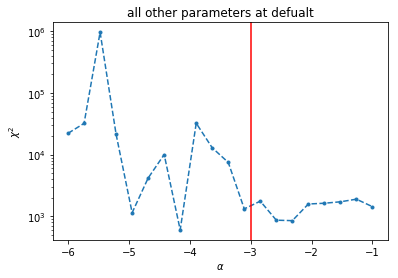

In [166]:
figure()
semilogy(alphas_long, chi2_alpha_long, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('all other parameters at defualt')

Text(0.5, 1.0, 'all other parameters at defualt')

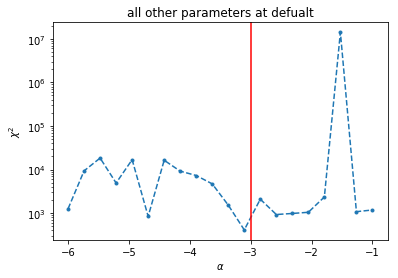

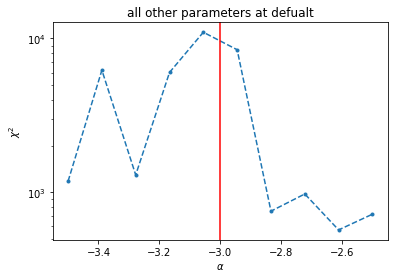

In [193]:
figure()
semilogy(alphas_long, chi2_alpha_long, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('all other parameters at defualt')

figure()
semilogy(alphas_tight, chi2_alpha_tight, '.--')
xlabel(r'$\alpha$')
ylabel(r'$\chi^2$')
axvline(-3.0, color='r')
title('all other parameters at defualt')

In [ ]:
#below with N=100 takes ~10 mins to run. I've saved the chi square values to a file
#chi_square_realisation.npy
#has 100 realisations of chi2 with all default parameters

In [202]:
#check how much chi2 varies with realisations of the same parameters input:
start = time.time()
N=100
chi2_realisation = np.zeros(N)
for i in range(N):
    chi_square = 0
    full_map = ff.map_full_power(30e9)
    data = hp.anafast(full_map)
    mom0x0 = ff.auto0x0(30e9)
    mom1x1 = ff.auto1x1(30e9)
    mom0x2 = ff.auto0x2(30e9)
    model = mom0x0 + mom1x1 + mom0x2
    resid = data - model
    for ell in range(len(resid)):
        cosmic_var = 2/(2*ell+1) * data[ell]**2
        chi_square += resid[ell]**2 / cosmic_var
    chi2_realisation[i] += chi_square
end=time.time()
print(end-start)

706.6053910255432


In [212]:
chi2_realisation

array([1.25804234e+06, 3.17844458e+03, 6.69634678e+03, 8.26298548e+03,
       4.78075163e+03, 2.00226684e+03, 5.55350607e+02, 5.25824531e+03,
       8.85067012e+02, 1.14996070e+04, 4.17781440e+03, 4.13158571e+03,
       4.91269917e+03, 1.20894758e+04, 2.47254150e+03, 7.22395659e+02,
       7.58080299e+03, 3.79895180e+03, 1.08001433e+04, 9.94421313e+02,
       1.21773049e+04, 5.95075251e+03, 2.16369230e+03, 5.04879831e+02,
       2.08973983e+05, 1.77642540e+03, 7.03438278e+02, 7.41105850e+03,
       1.47906978e+03, 6.05723590e+03, 6.08462559e+02, 6.66783438e+03,
       9.40613708e+02, 1.54542333e+04, 3.11944007e+03, 8.85761722e+03,
       1.69272236e+04, 2.68760029e+03, 1.78624851e+03, 3.50279070e+03,
       3.16889796e+03, 5.48776385e+03, 2.78968481e+03, 8.39956286e+03,
       5.73927915e+02, 9.24205743e+02, 4.82887852e+03, 8.35683208e+03,
       1.88774862e+03, 3.29910195e+03, 7.11564815e+03, 2.49625488e+03,
       6.29705104e+03, 1.46016154e+03, 3.02699661e+03, 6.07633069e+03,
      

In [215]:
print(np.median(chi2_realisation))
print(np.mean(chi2_realisation))

3132.7836657602875
33467345.705171723


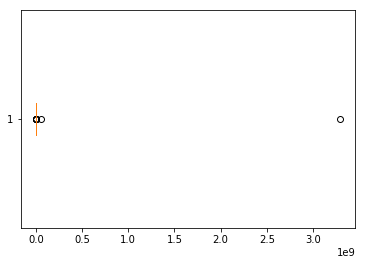

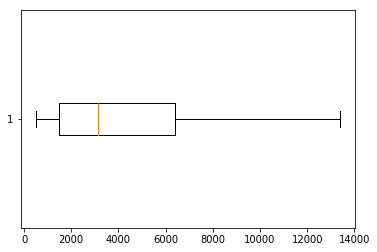

In [219]:
figure()
boxplot(chi2_realisation, vert=False);
figure()
boxplot(chi2_realisation, vert=False, sym='');

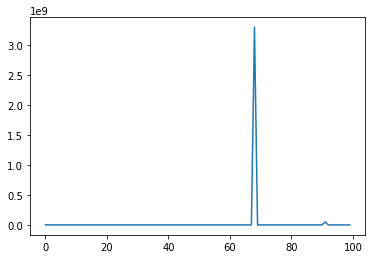

In [213]:
plot(chi2_realisation)
ylim(0,)

In [214]:
np.save('chi_square_realisation', chi2_realisation)